# 13TeV MC validation

In [1]:
run ../prep_ana.py

Welcome to JupyROOT 6.08/00
Loading plotting specs...
8 or 13 TeV:13TeV
unc_mc_process and scales as dictionaries
Load MC and Data?False
df = pd.concat([df_dy0, df_dy1, df_dy2, df_dy3, df_dy4, df_dy_m_10, df_ww, df_tt_l, df_tt_sl, df_zz_ln, df_wz_ln, df_wz_lq ])


In [2]:
data_path = '../data_13TeV/out_Z'
data_path = '../data_13TeV_alpha'



In [3]:
%matplotlib inline

In [4]:
columns = [ 'process', 'process_decay',
        'weight', 'lep1_Charge', 'lep2_Charge', 'lep_Type', 'numbExtraLep',
        'tot_npv', 'mll', 'numb_jets', 'metMod',
        'lep1_pt', 'lep2_pt', 'lep3_pt', 'dPhiLL',
        'jet1_pt', 'jet2_pt', 'HT', 'numb_BJet',
        'METProj_sin', 'met_over_sET','METProj_trk_sin', 'met_phi',
        'dPhiLLMET',  'mllMET', 'qT', 'recoil', 'dPhiLLJet', 'dPhiMETJet', 'gen_weight']

df_dy0 = rp.read_root(data_path+"/dyjetstoll_m-50_complete.root", columns=columns)
df_dy_m_10 = rp.read_root(data_path+"/dyjetstoll_m-10to50_complete.root", columns=columns)
df_ww = rp.read_root(data_path+"/ww_complete.root", columns=columns)
df_tt_l = rp.read_root(data_path+"/ttbar_leptonic_complete.root", columns=columns)
df_tt_sl = rp.read_root(data_path+"/ttbar_semileptonic_complete.root", columns=columns)
df_t_s = rp.read_root(data_path+"/t_s-_complete.root", columns=columns)
df_t_t = rp.read_root(data_path+"/t_t-_complete.root", columns=columns)
df_t_tw = rp.read_root(data_path+"/t_tw-_complete.root", columns=columns)
#df_tbar_s = rp.read_root(data_path+"/tbar_s-_complete.root", columns=columns)
df_tbar_t = rp.read_root(data_path+"/tbar_t-_complete.root", columns=columns)
df_tbar_tw = rp.read_root(data_path+"/tbar_tw-_complete.root", columns=columns)
df_zz_ln = rp.read_root(data_path+"/zzjetsto2l2nu_complete.root", columns=columns)
df_zz_lq = rp.read_root(data_path+"/zzjetsto2l2q_complete.root", columns=columns)
df_wz_lq = rp.read_root(data_path+"/wzjetsto2l2q_complete.root", columns=columns)
df_wz_ln = rp.read_root(data_path+"/wzjetsto3lnu_complete.root", columns=columns)
df_w1j = rp.read_root(data_path+"/w1jetstolnu_complete.root", columns=columns)
df_w2j = rp.read_root(data_path+"/w2jetstolnu_complete.root", columns=columns)
df_w3j = rp.read_root(data_path+"/w3jetstolnu_complete.root", columns=columns)
df_w4j = rp.read_root(data_path+"/w4jetstolnu_complete.root", columns=columns)
#df_h_ww = rp.read_root(data_path+"/glugluh_complete.root", columns=columns)
#df_wg = rp.read_root(data_path+"/wg_complete.root", columns=columns)

df = pd.concat([df_dy0, df_dy_m_10, df_tt_l, df_tt_sl, df_zz_ln, df_zz_lq, df_wz_lq, df_wz_ln, df_w1j, df_w2j, df_w3j, df_w4j, df_ww,
               df_tbar_tw, df_tbar_t,df_t_tw,  df_t_t, df_t_s])

Warning in <TStreamerInfo::BuildCheck>: 
   The StreamerInfo of class string read from file ../data_13TeV_alpha/dyjetstoll_m-50_complete.root
   has the same version (=2) as the active class but a different checksum.
   You should update the version to ClassDef(string,3).
   Do not try to write objects with the current class definition,
   the files will not be readable.

Warning in <TStreamerInfo::CompareContent>: The following data member of
the in-memory layout version 2 of class 'string' is missing from 
the on-file layout version 2:
   string::_Alloc_hider _M_dataplus; //
Warning in <TStreamerInfo::CompareContent>: The following data member of
the in-memory layout version 2 of class 'string' is missing from 
the on-file layout version 2:
   unsigned long _M_string_length; //
Warning in <TStreamerInfo::CompareContent>: The following data member of
the in-memory layout version 2 of class 'string' is missing from 
the on-file layout version 2:
   string::(anonymous) ; //


In [8]:
#df.gen_weight.values[df.process_decay.values != 'DYJetsToLL_M-50'] = 1
#df.gen_weight = df.gen_weight.values / np.abs(df.gen_weight.values)
#df.weight = df.weight * df.gen_weight

df["gen_weight"] = df.gen_weight.values/ np.abs(df.gen_weight.values)
df["weight"] = df.weight.values * df.gen_weight.values

In [9]:
df_da_b = rp.read_root(data_path+"/muon_2016B_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_c = rp.read_root(data_path+"/muon_2016C_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_d = rp.read_root(data_path+"/muon_2016D_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_e = rp.read_root(data_path+"/muon_2016E_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_f = rp.read_root(data_path+"/muon_2016F_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_g = rp.read_root(data_path+"/muon_2016G_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_h = rp.read_root(data_path+"/muon_2016H_complete.root", columns=columns+["runNum", "eventNumb"])

df_da = pd.concat([df_da_b, df_da_c, df_da_d, df_da_e, df_da_f, df_da_g, df_da_h])

In [6]:
df_da_b_mue = rp.read_root(data_path+"/muoneg_2016B_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_c_mue = rp.read_root(data_path+"/muoneg_2016C_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_d_mue = rp.read_root(data_path+"/muoneg_2016D_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_e_mue = rp.read_root(data_path+"/muoneg_2016E_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_f_mue = rp.read_root(data_path+"/muoneg_2016F_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_g_mue = rp.read_root(data_path+"/muoneg_2016G_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_h_mue = rp.read_root(data_path+"/muoneg_2016H_complete.root", columns=columns+["runNum", "eventNumb"])

df_da_mue = pd.concat([df_da_b_mue, df_da_c_mue, df_da_d_mue, df_da_e_mue, df_da_f_mue, df_da_g_mue, df_da_h_mue]).reset_index()

df_da_b_ee = rp.read_root(data_path+"/eg_2016B_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_c_ee = rp.read_root(data_path+"/eg_2016C_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_d_ee = rp.read_root(data_path+"/eg_2016D_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_e_ee = rp.read_root(data_path+"/eg_2016E_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_f_ee = rp.read_root(data_path+"/eg_2016F_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_g_ee = rp.read_root(data_path+"/eg_2016G_complete.root", columns=columns+["runNum", "eventNumb"])
df_da_h_ee = rp.read_root(data_path+"/eg_2016H_complete.root", columns=columns+["runNum", "eventNumb"])

df_da_ee = pd.concat([df_da_b_ee, df_da_c_ee, df_da_d_ee, df_da_e_ee, df_da_f_ee, df_da_g_ee, df_da_h_ee]).reset_index()


df_da = pd.concat( [df_da, df_da_mue, df_da_ee] ).reset_index()
df_da = df_da.drop(np.where(df_da[["runNum", "eventNumb"]].duplicated())[0])

(<matplotlib.figure.Figure at 0x7f8d8b38fc90>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f8d47912450>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f8d46f6bc50>], dtype=object))

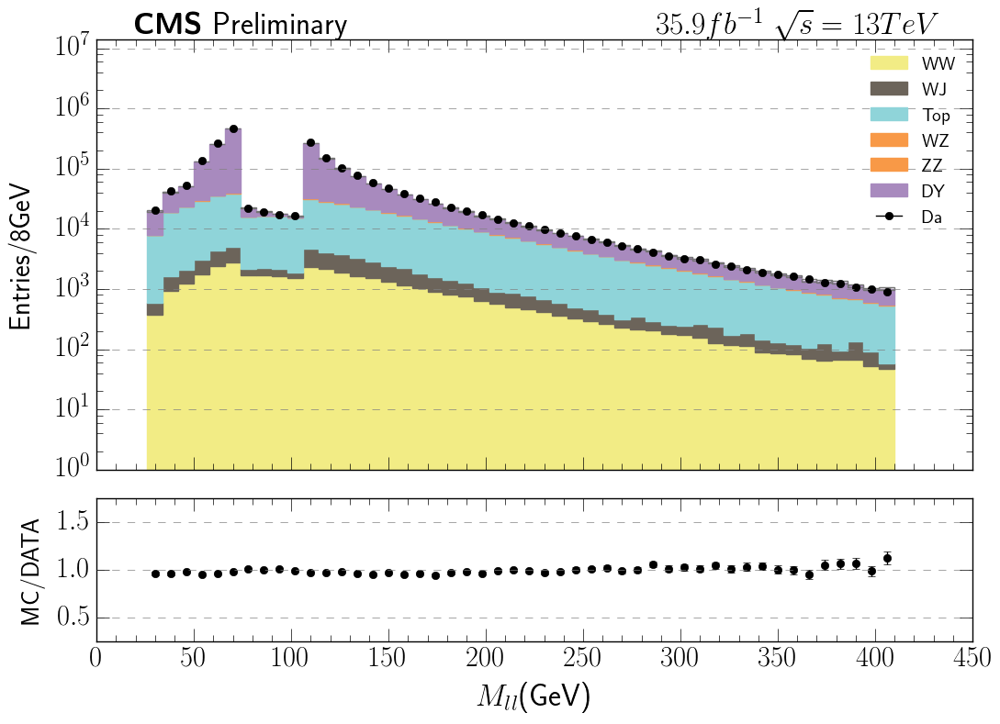

In [11]:
mc = bin_df( df[(df.mll > 30) & (df.lep2_pt > 25) & (df.lep1_pt > 25)], "mll", )
da = bin_df( df_da[(df_da.mll > 30) & (df_da.lep2_pt > 25) & (df_da.lep1_pt > 25)], "mll",)

full_plot(mc, da, color="color_1")

(<matplotlib.figure.Figure at 0x7ff7cd2c8490>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7cd41b4d0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7ff7cca11410>], dtype=object))

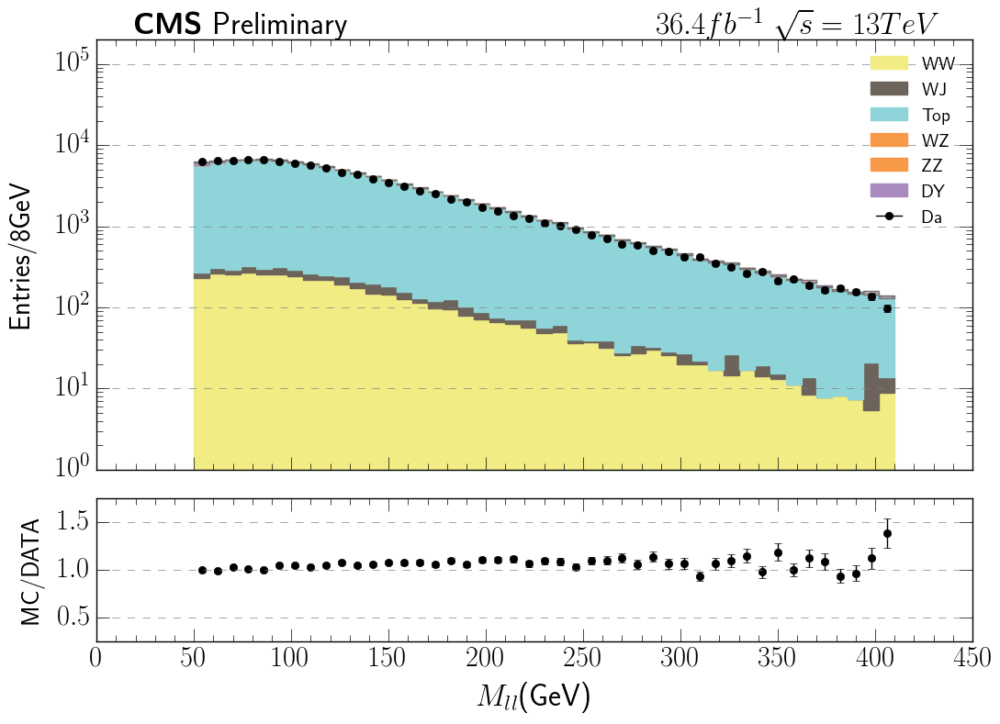

In [17]:
mc = bin_df( TT_ana(df[(df.mll > 30) & (df.lep2_pt > 20) & (df.lep1_pt > 20)]), "mll", )
da = bin_df( TT_ana(df_da[(df_da.mll > 30) & (df_da.lep2_pt > 20) & (df_da.lep1_pt > 20)]), "mll",)

full_plot(mc, da, color="color_1")

# Control Regions

## WW control region

(<matplotlib.figure.Figure at 0x7f3345400110>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f33453dc7d0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f3344bccf10>], dtype=object))

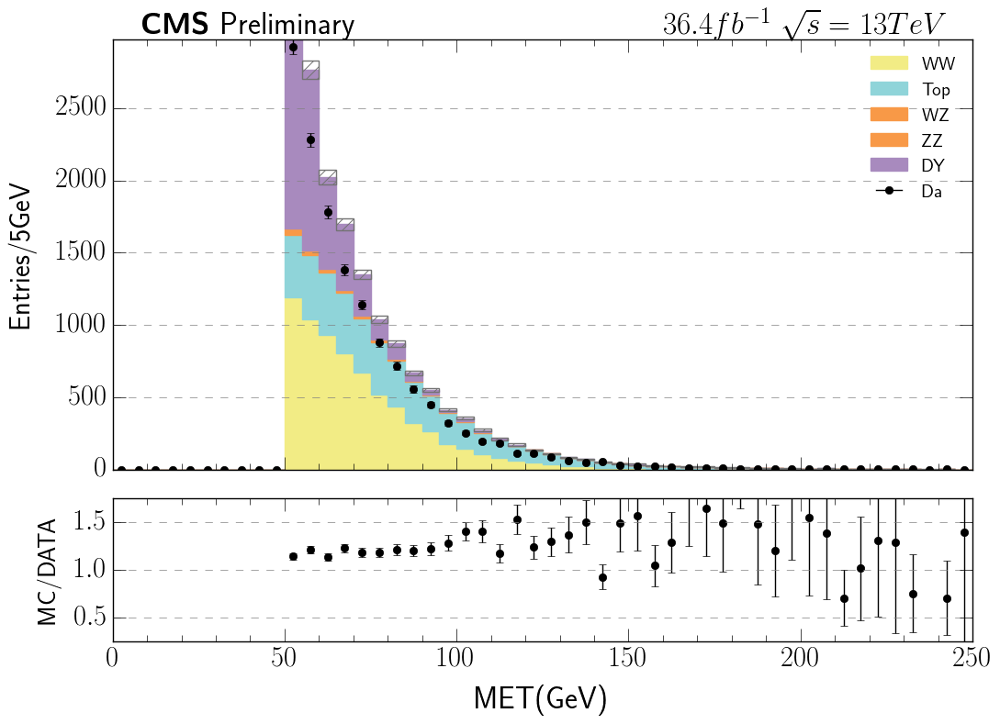

In [28]:
mc_ww = WW_ana(df[df.mll >= 30])
da_ww = WW_ana(df_da[df_da.mll >= 30 ])

mc = bin_df(mc_ww, "metMod", scales=scales, )
da = bin_df(da_ww, "metMod",  scales=scales, )
full_plot(mc, da, color="color_1", logy=False, y_range=(0,np.max(da["Da"][0])+50))

## TTbar control region

(<matplotlib.figure.Figure at 0x182b7e8d0>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x182f619d0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x18402a9d0>], dtype=object))

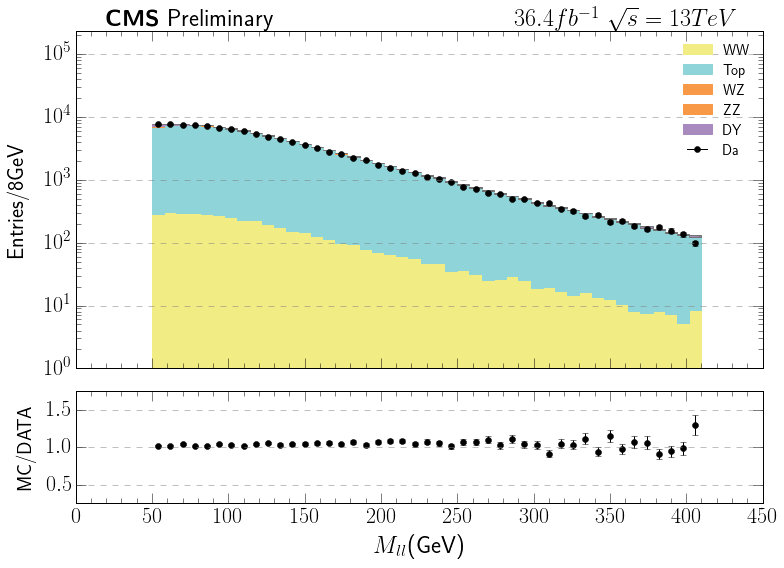

In [21]:
mc_tt = TT_ana(df[df.mll > 30])
da_tt = TT_ana(df_da[df_da.mll > 30])

mc = bin_df(mc_tt, "mll",)
da = bin_df(da_tt, "mll",)
full_plot(mc, da, color="color_1")

## Drell Yan control region

(<matplotlib.figure.Figure at 0x15e878710>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x151dbf8d0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x18acf4190>], dtype=object))

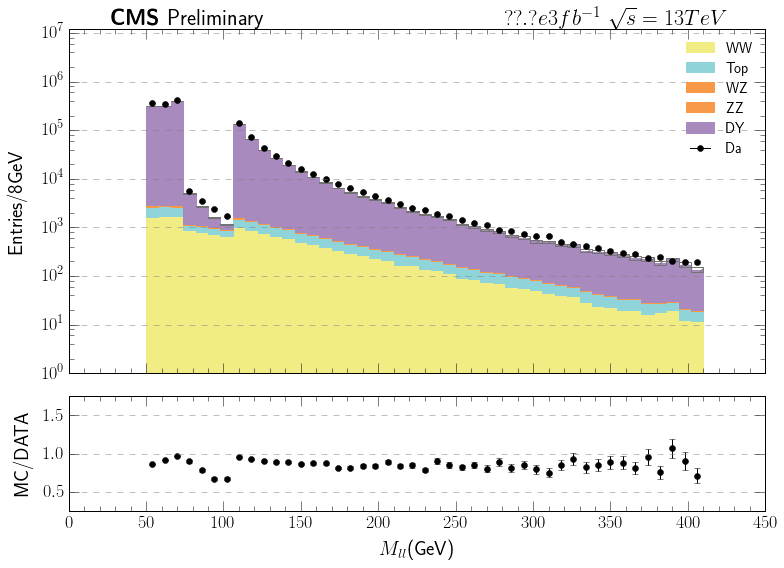

In [102]:
mc_dy = DY_ana(df)
da_dy = DY_ana(df_da)

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

## Z &rarr; &tau; &tau; control region

(<matplotlib.figure.Figure at 0x1588ec690>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1899c0590>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x18de0d6d0>], dtype=object))

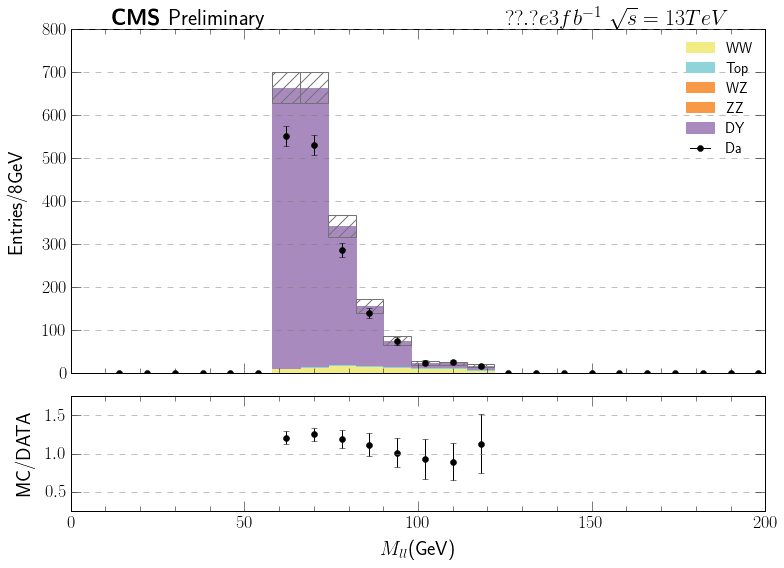

In [103]:
feature = 'mll'
df_mc = Z_tt_ana(df)
df_data = Z_tt_ana(df_da)

bins_mc_ = bin_df( df_mc, feature, )#weights=False) 
bins_data_ = bin_df( df_data, feature, )

full_plot(bins_mc_, bins_data_, color="color_1", logy=False, y_range=(0,800), x_range=(0, 200))

# Addition regions

## Pre cuts

In [66]:
mc_dy = pre_cuts(df[df.mll > 30])
da_dy = pre_cuts(df_da[df_da.mll > 30])

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

AttributeError: 'DataFrame' object has no attribute 'numb_BJet'

## Custom WW control region

In [64]:
def test_WW_ana( df, n_jets=0, met=50 ):
  initial_cuts = (df.mll > 50 )  & (df.numbExtraLep == 0) & (df.numb_jets <=  n_jets) & ( df.metMod > met ) & ( df.metMod < 150 )
  dif_flavor_cut = (df.lep_Type > 0)

  basic_df_0j_cuts = initial_cuts & dif_flavor_cut
  return df[basic_df_0j_cuts] 

(<matplotlib.figure.Figure at 0x15c546610>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x15d585f10>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x15758d810>], dtype=object))

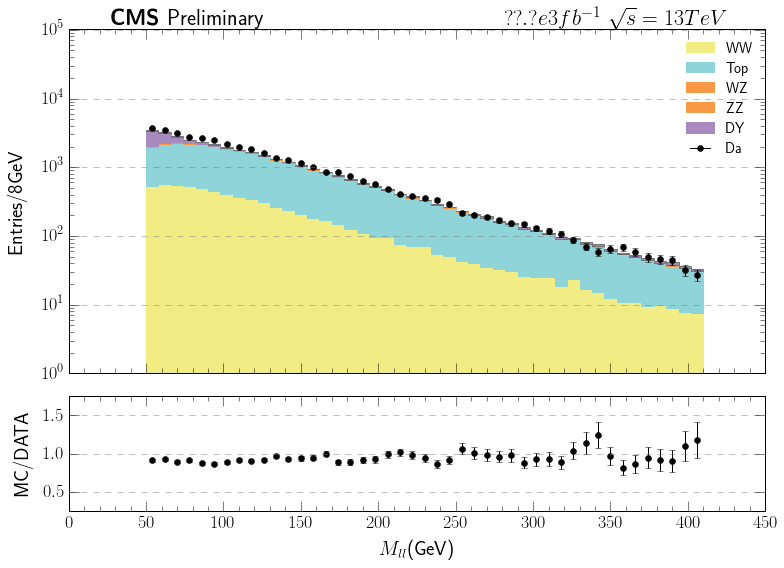

In [65]:
mc_dy = test_WW_ana(df, n_jets=1)
da_dy = test_WW_ana(df_da, n_jets=1)

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

(<matplotlib.figure.Figure at 0x2881cb9d0>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x289717b90>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x2d9285fd0>], dtype=object))

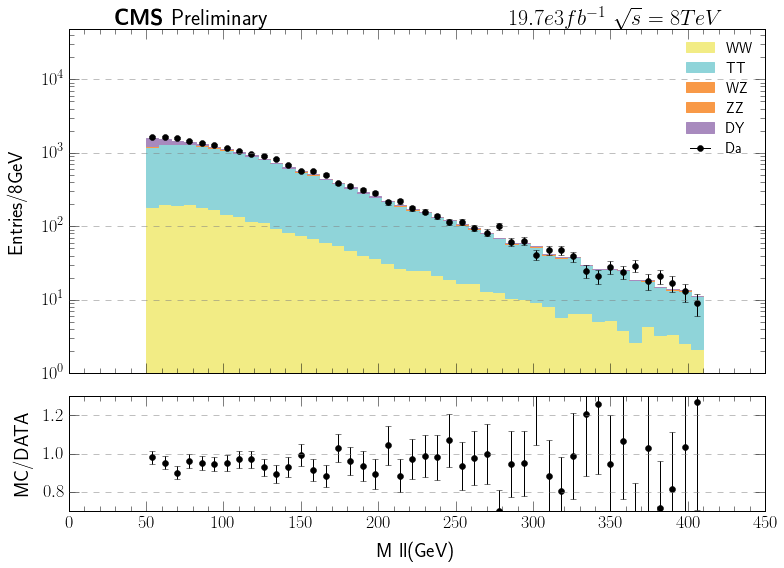

In [17]:
mc_dy = test_WW_ana(df, n_jets=2)
da_dy = test_WW_ana(df_da, n_jets=2)

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

(<matplotlib.figure.Figure at 0x28a181590>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x2d84b4dd0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x2d8fd6290>], dtype=object))

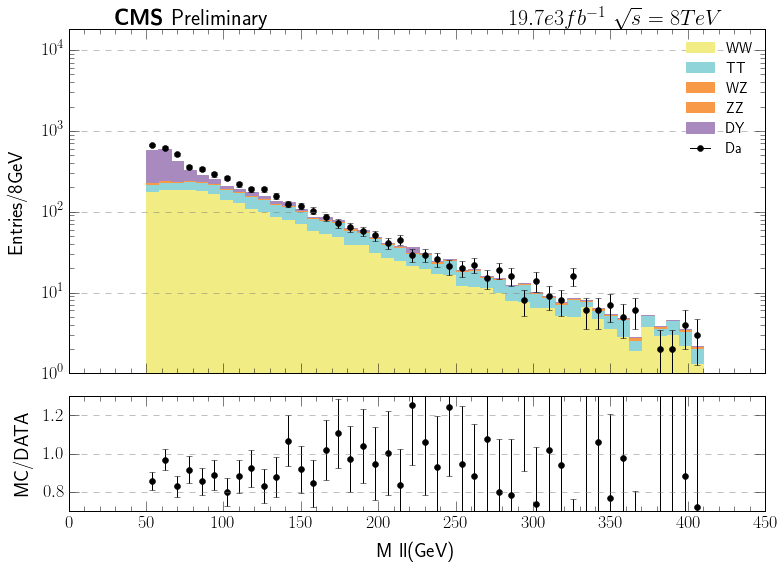

In [20]:
mc_dy = test_WW_ana(df, met=40)
da_dy = test_WW_ana(df_da, met=40)

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

(<matplotlib.figure.Figure at 0x2db6a42d0>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x2dba7dd50>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x2da2b8210>], dtype=object))

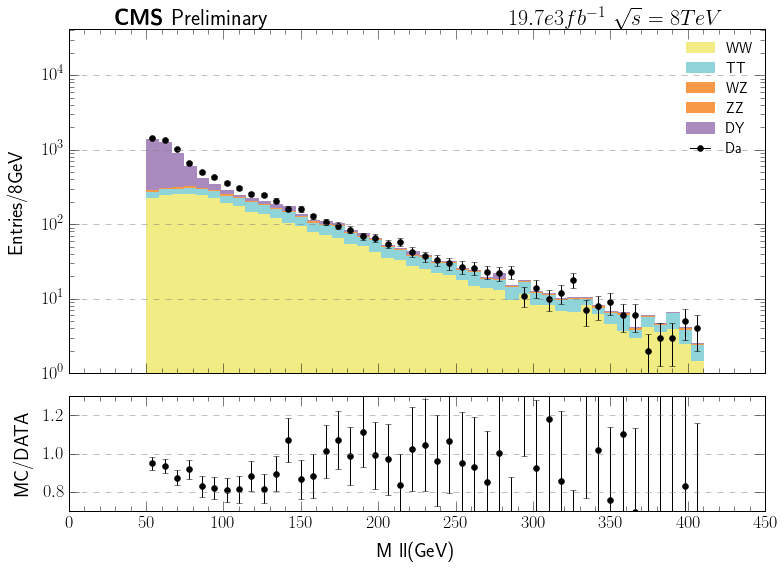

In [22]:
mc_dy = test_WW_ana(df, met=30)
da_dy = test_WW_ana(df_da, met=30)

mc = bin_df(mc_dy, "mll",)
da = bin_df(da_dy, "mll",)
full_plot(mc, da, color="color_1")

## Custom Z &rarr; &tau; &tau; region

In [61]:
def test_Z_tt_ana( df ):
    initial_cuts = (df.mll > 50 )  & (df.numbExtraLep == 0) & (df.numb_jets ==  0) & ( df.qT < 30 )
   
    dif_flavor_cut = (df.lep_Type > 0)
   
    m_1 = (df.mll < 120) & (df.mll > 75)
    met_1 = (df.metMod > 30) & (df.metMod < 80)

    return df[ initial_cuts & met_1 & m_1 & dif_flavor_cut ]

(<matplotlib.figure.Figure at 0x33a5bf950>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x33a6a9150>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x334405ed0>], dtype=object))

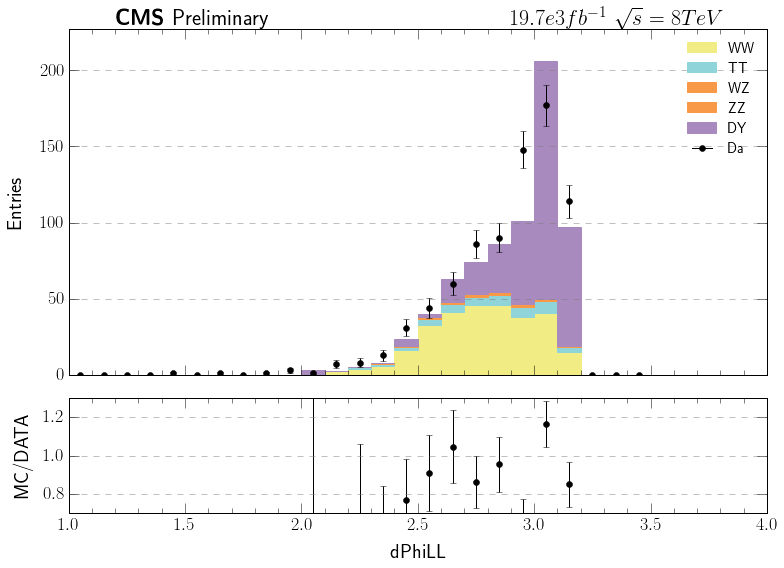

In [62]:
mc = test_Z_tt_ana(df,)
da = test_Z_tt_ana(df_da,)

mc = bin_df(mc, "dPhiLL",range=(1.,3.5), bins=25)
da = bin_df(da, "dPhiLL",range=(1.,3.5), bins=25)
full_plot(mc, da, color="color_1",logy=False, y_range=(0,np.max(da["Da"][0])+50) )

# Make all the plots

full
numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
qT
dPhiLLJet
met_phi
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLMET
dPhiMETJet
mllMET
Z_tt
numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
qT
dPhiLLJet
met_phi
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLMET
dPhiMETJet
mllMET
TT
numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
qT
dPhiLLJet
met_phi
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLMET
dPhiMETJet
mllMET
same
numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
qT
dPhiLLJet
met_phi
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLMET
dPhiMETJet
mllMET
WW
numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
qT
dPhiLLJet
met_phi
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLMET
dPhiMETJet
mllMET
DY
numb_B

/home/tgunter/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


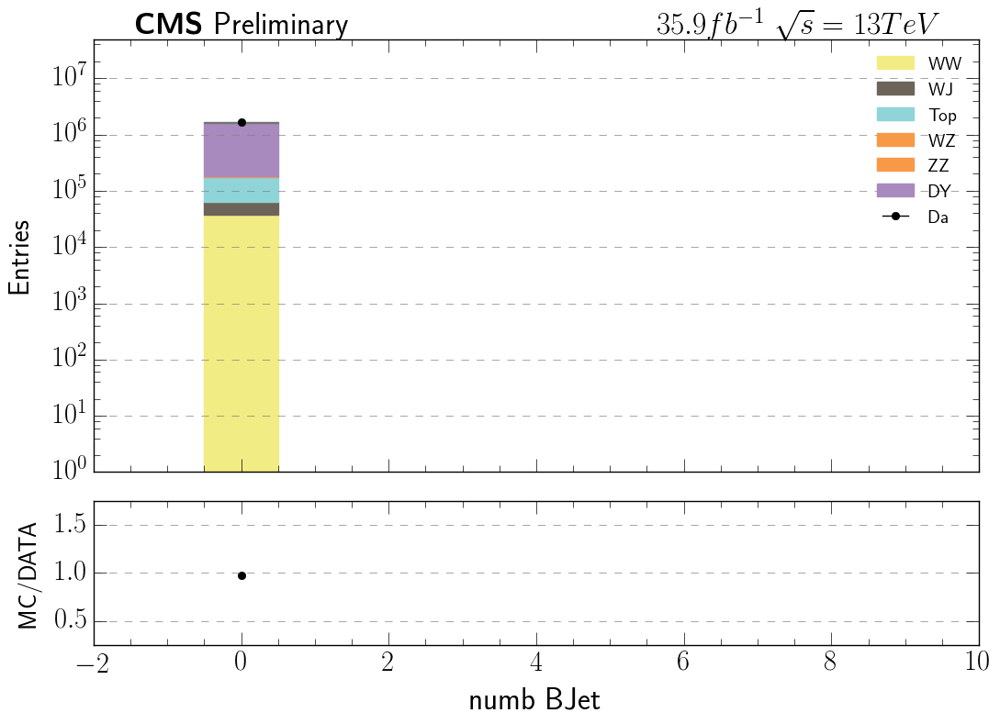

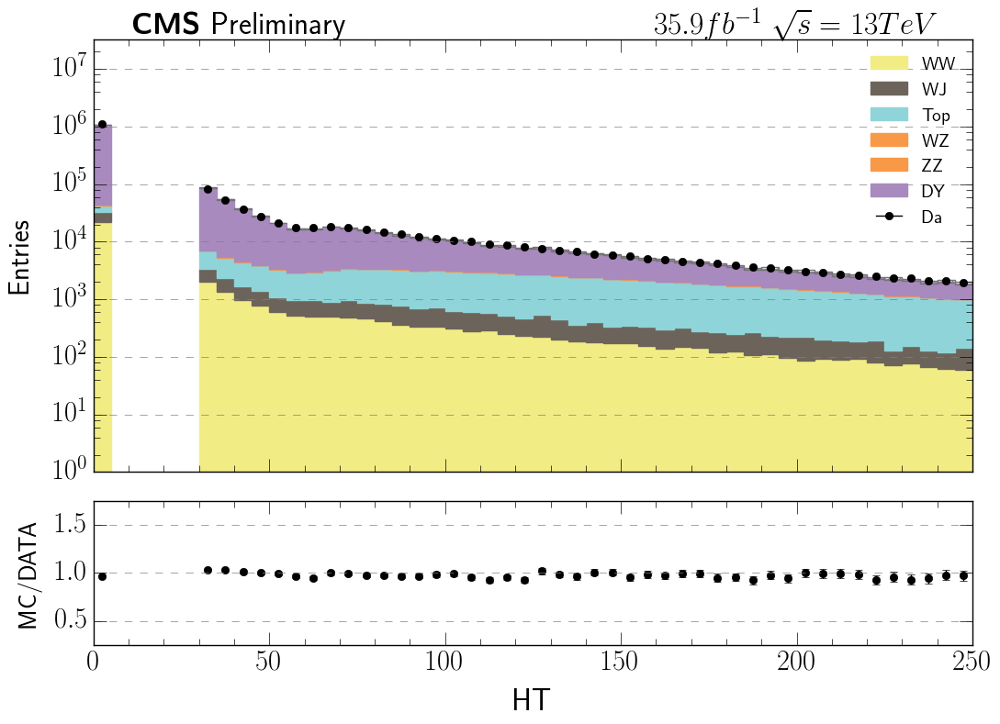

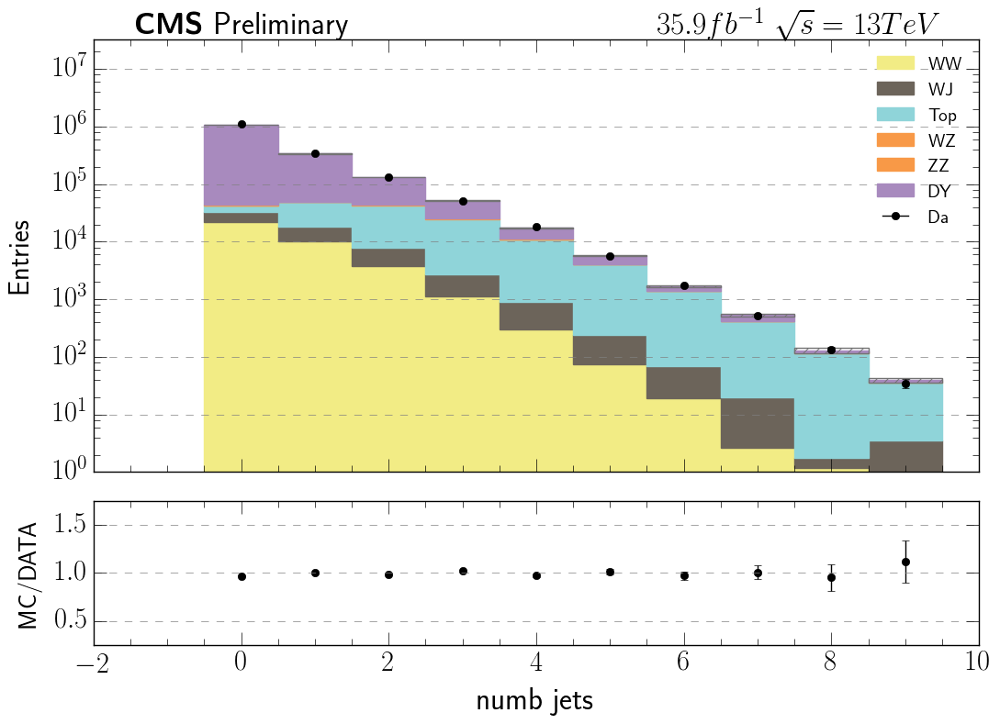

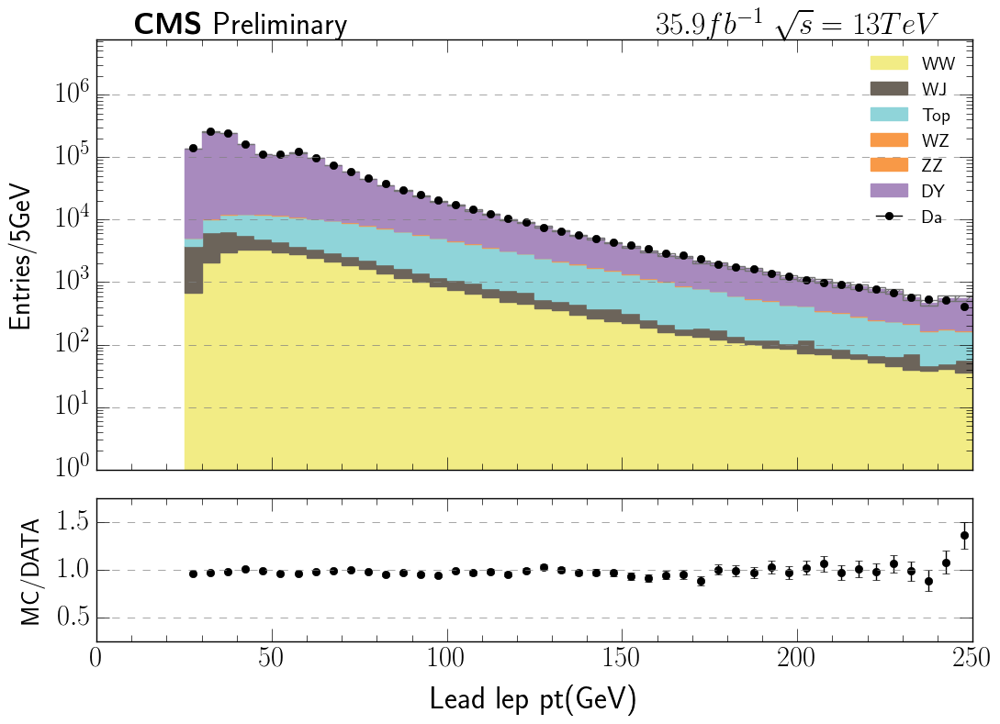

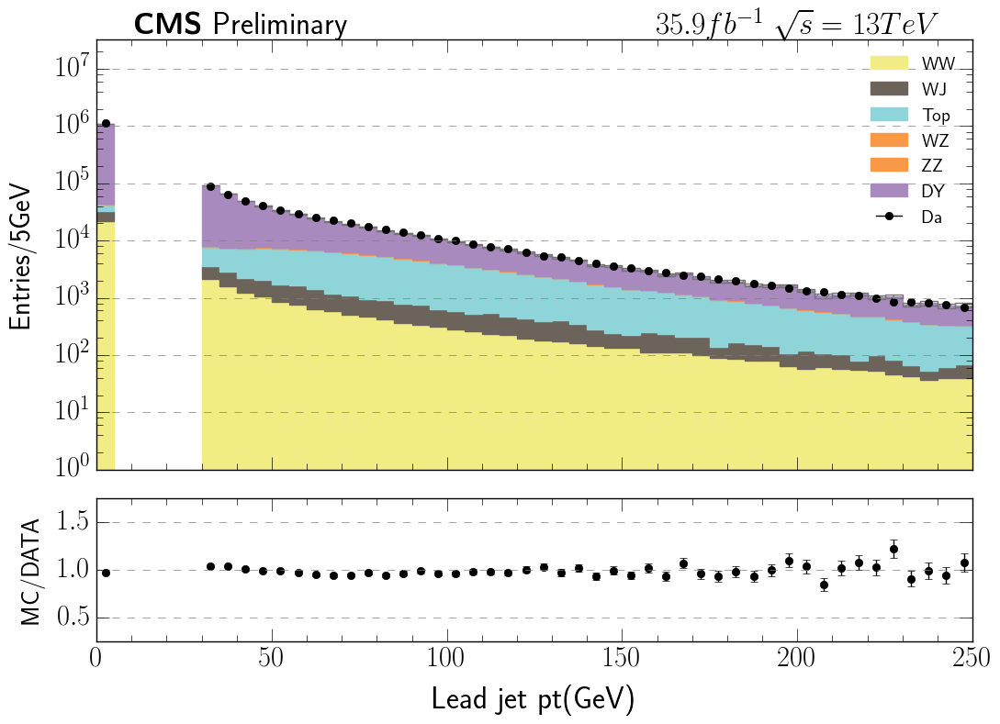

...

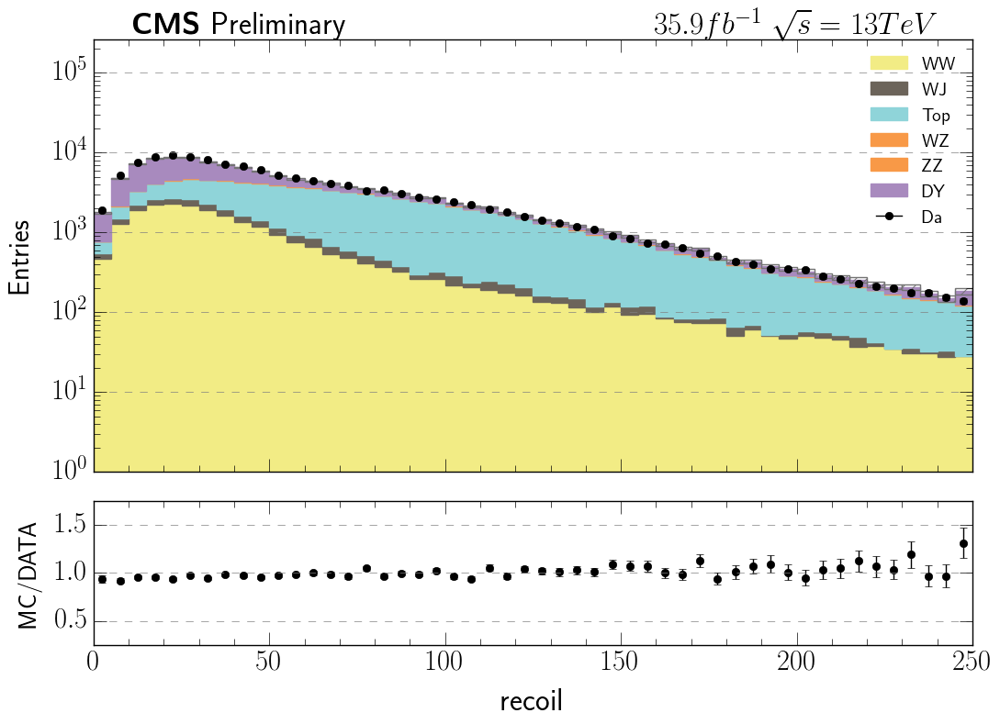

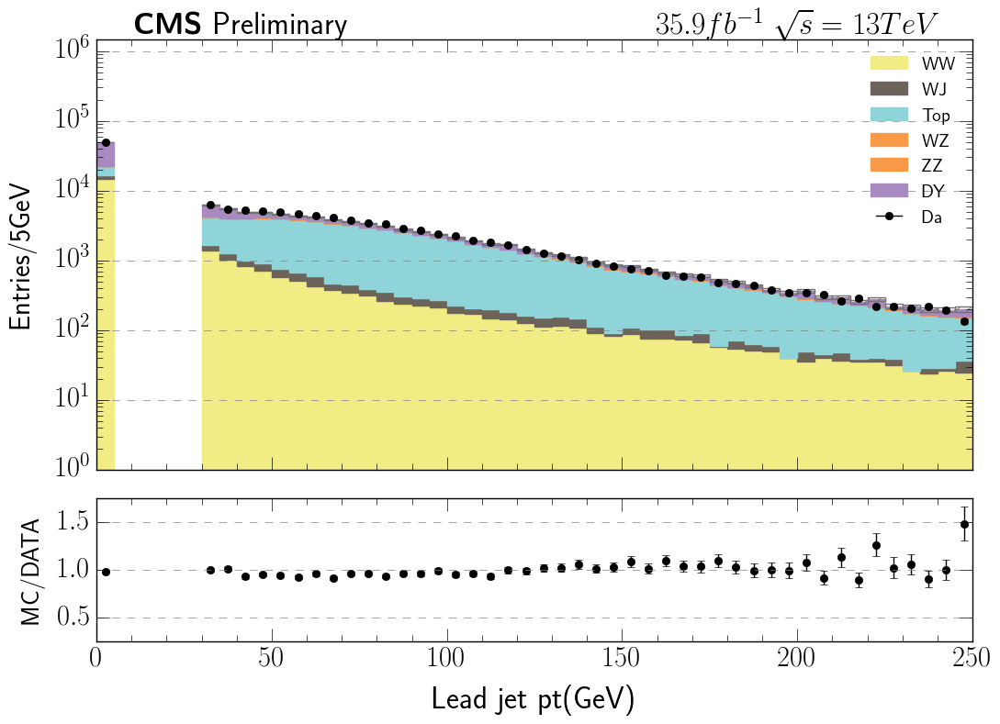

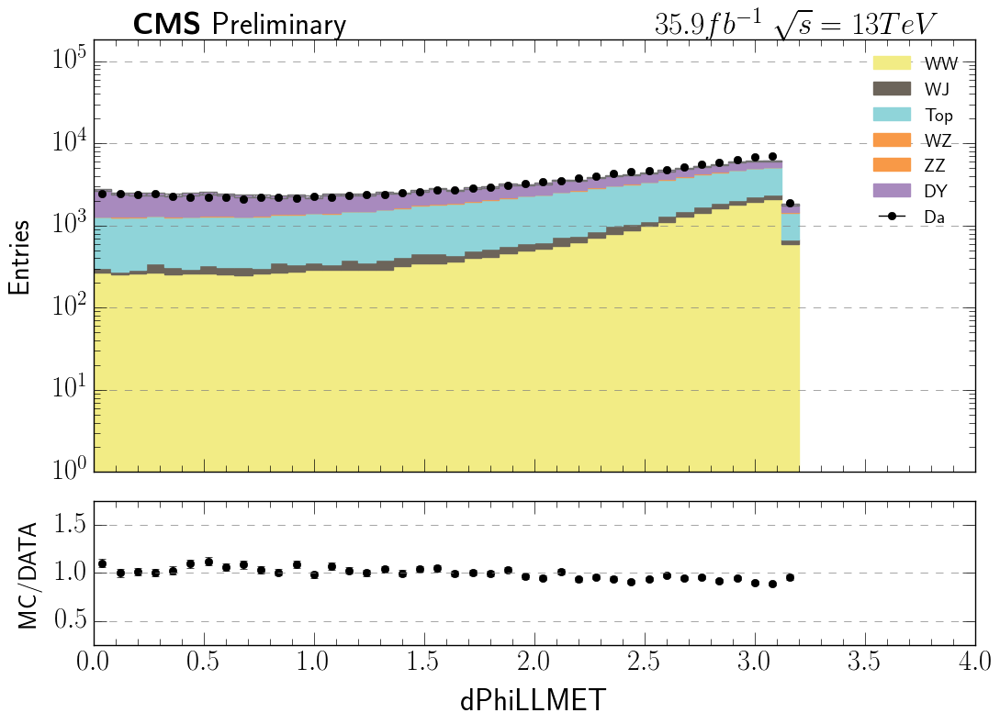

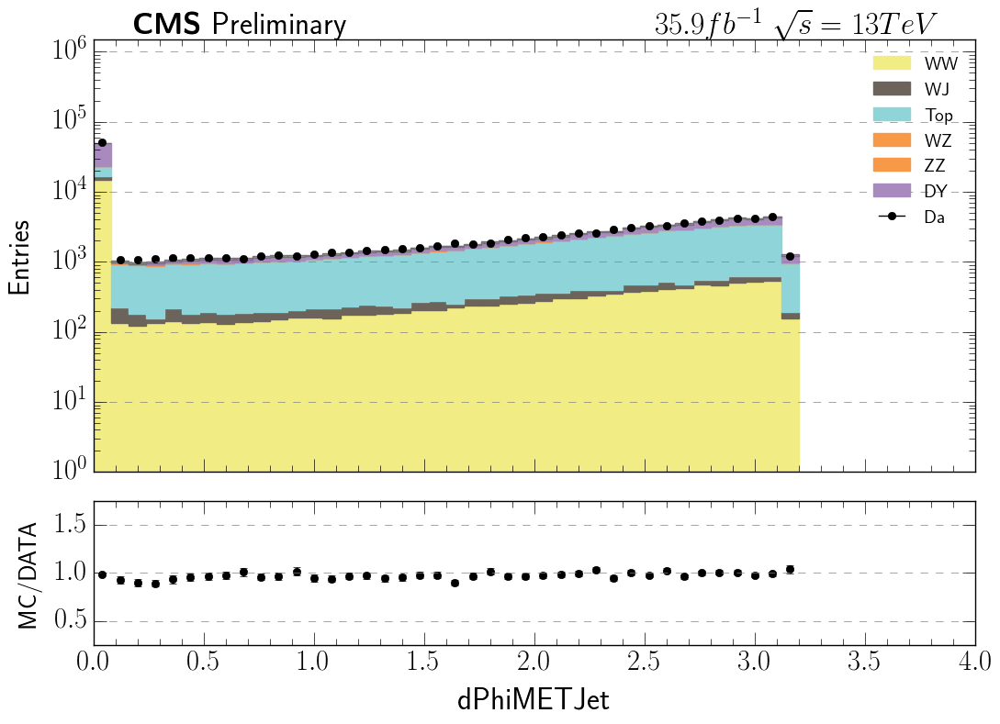

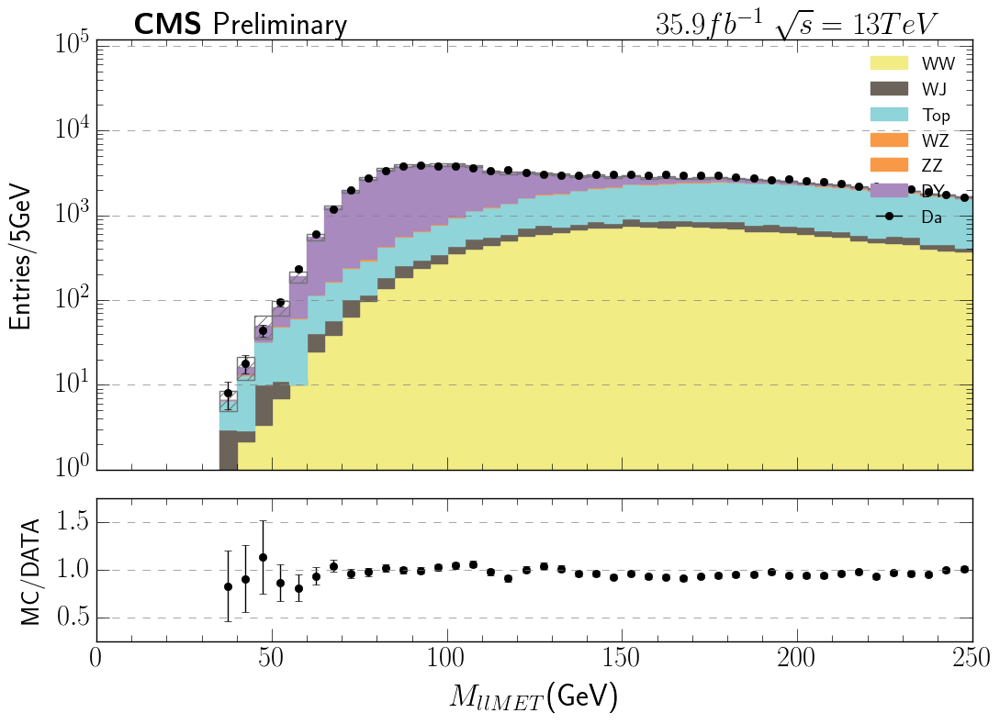

In [12]:
make_control_plots( pre_cuts(df[(df.mll > 30)  & (df.lep2_pt > 25) & (df.lep1_pt > 25)], diff_charge=False), pre_cuts(df_da[(df_da.mll > 30)  & (df_da.lep2_pt > 25) & (df_da.lep1_pt > 25)], diff_charge=False), "may", "pre", energy_dir= "13TeV" )
#make_control_plots( df[df.mll > 30], df_da[df_da.mll > 30], "may", "full", energy_dir= "8TeV" )

W3JetsToLNu


(<matplotlib.figure.Figure at 0x1b7541e10>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1bf9a0fd0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x1c5535090>], dtype=object))

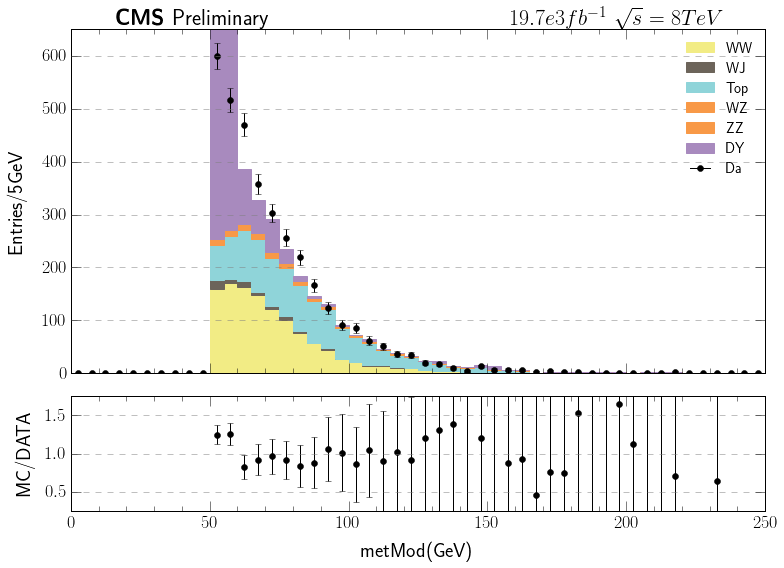

In [94]:
flavor = "same"
feature = "metMod"

mc = cuts_ana( df, flavor=flavor )
da = cuts_ana( df_da, flavor=flavor )

bins_wj = wjets_selection(mc, da, feature)

bins_mc = bin_df(mc[mc.lep1_Charge != mc.lep2_Charge], feature, )
bins_da = bin_df(da[da.lep1_Charge != da.lep2_Charge], feature, )

k_ = None
for k in bins_mc.keys():
    if k in ['W1JetsToLNu', 'W2JetsToLNu', 'W3JetsToLNu', 'W4JetsToLNu']:
        k_ = k
        bins_mc[k][0] = bins_mc[k][0]*0
        bins_mc[k][3] = bins_mc[k][3]*0
print k_
if k_ == None:
    k_ = 'W1JetsToLNu'
    bins_mc[k_] = bins_mc["WW"]
bins_mc[k_][0] = bins_wj
bins_mc[k_][3] = bins_wj
full_plot(bins_mc, bins_da, color="color_1",logy=False, y_range=(0,np.max(bins_da["Da"][0])+50) )

numb_BJet
HT
numb_jets
lep1_pt
jet1_pt
lep2_pt
jet2_pt
metMod
dPhiLL
METProj
qT
dPhiLLJet
met_phi
dPhiLL
lep3_pt
tot_npv
mll
METProj_sin
met_over_sET
METProj_trk_sin
recoil
jet1_pt
dPhiLLJet
dPhiLLMET
dPhiMETJet
mllMET


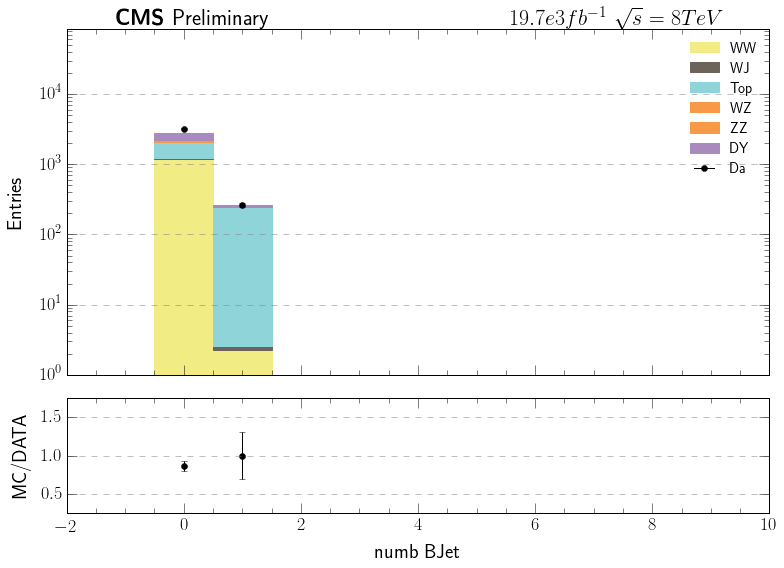

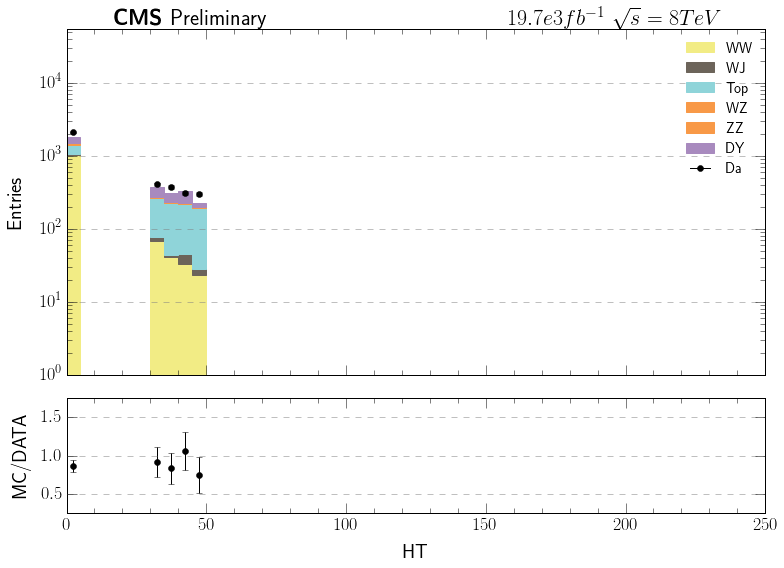

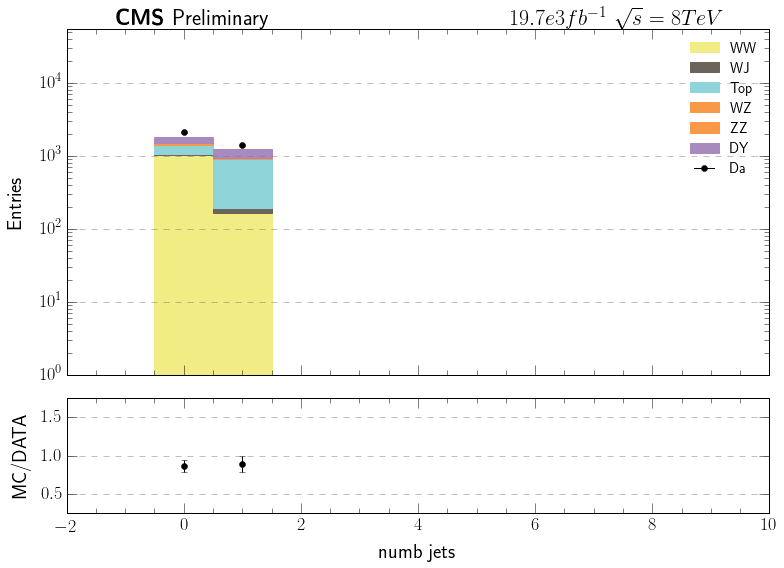

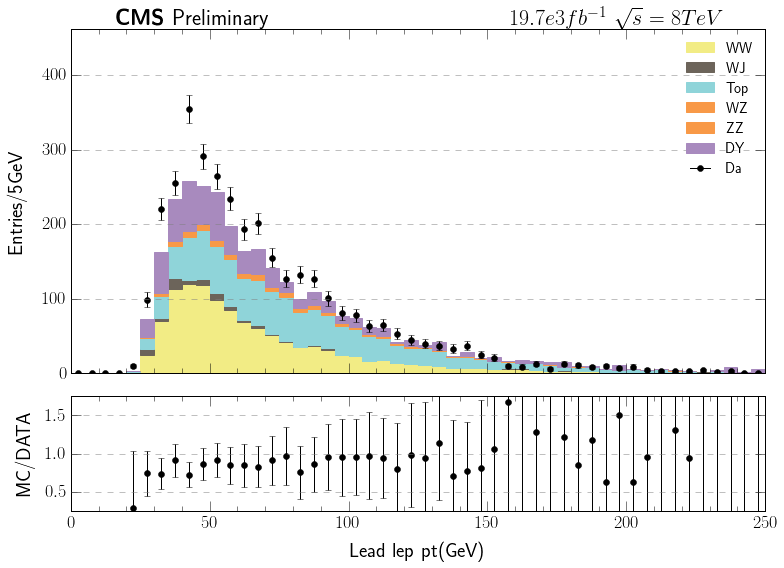

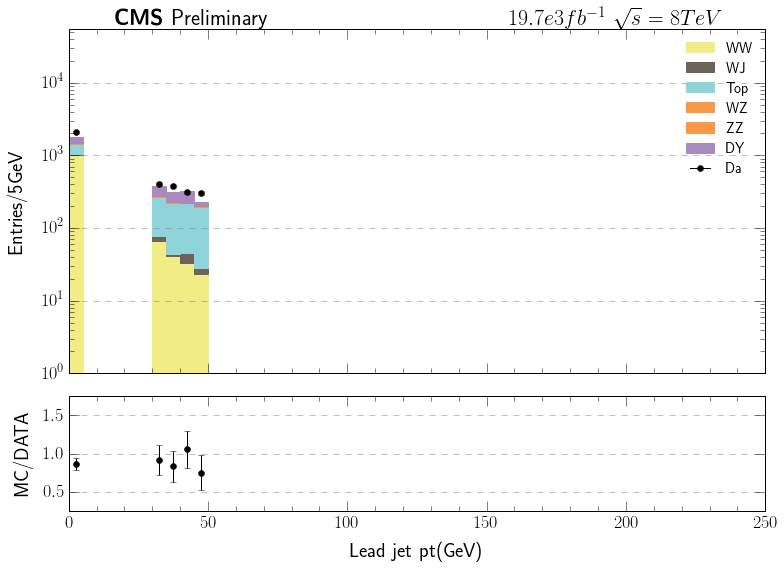

...

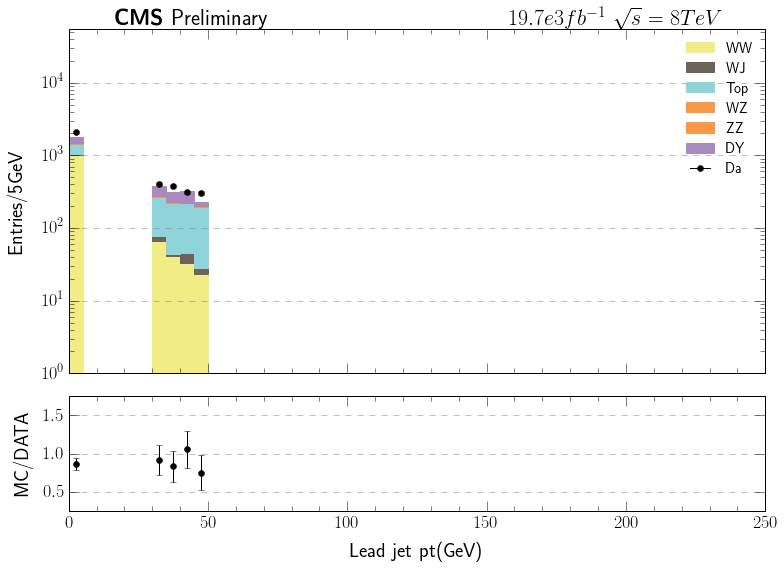

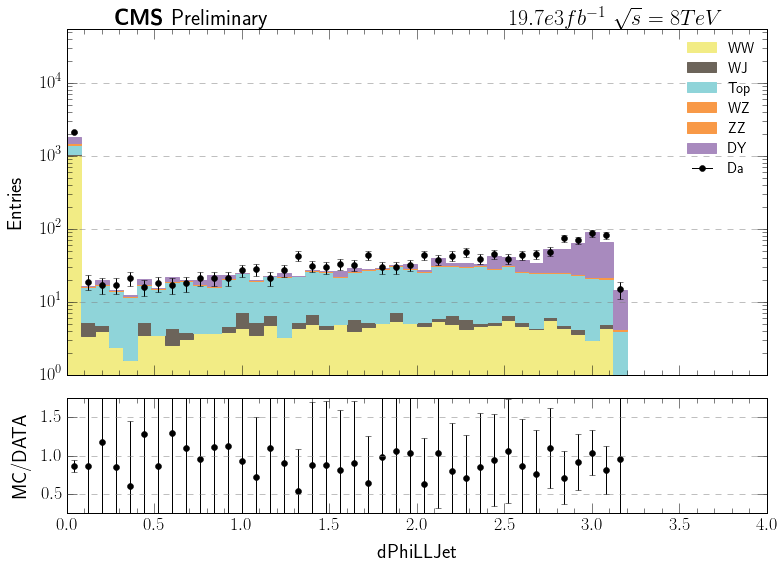

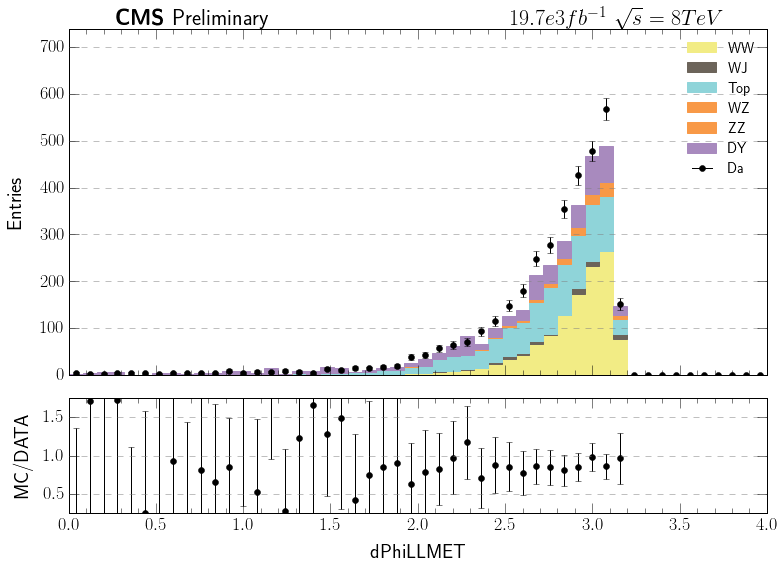

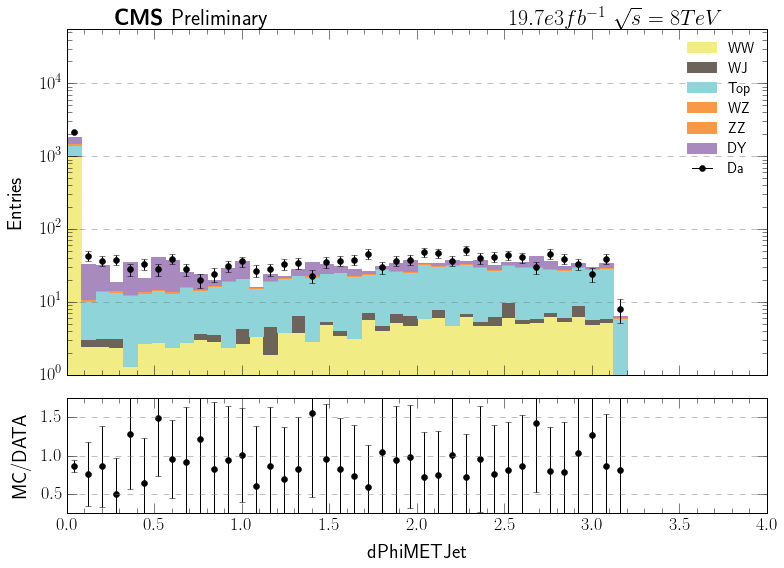

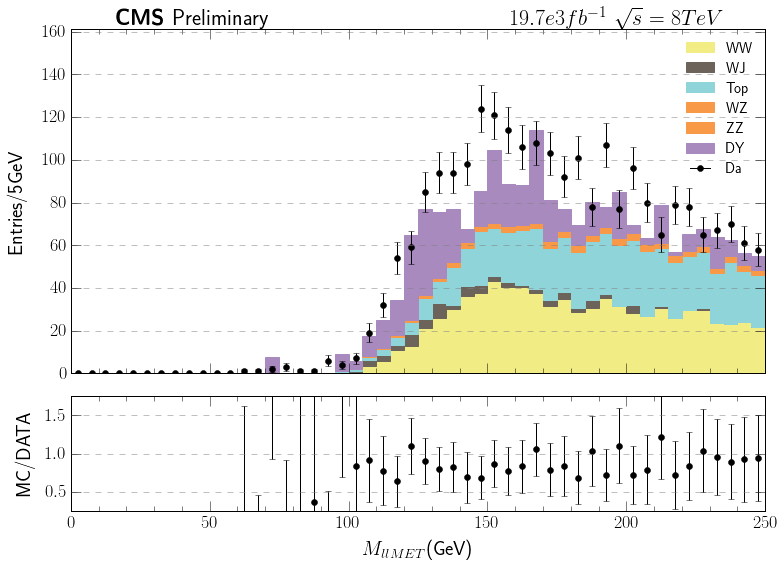

In [79]:
create_kinematic_hist(cuts_ana(df, flavor="same"), cuts_ana(df_da, flavor="same"), prefix="cuts_same")

# END

In [107]:
process_yields(cuts_ana(df, flavor="both"))

WW 1159.35570777 1947.6589959
DY 810.293833835 293.577338527
Top 1052.59089516 1816.80469782
WZ 100.313540021 118.656877774
ZZ 59.2305759702 2.89195289673
WJ 32.6403974474 227.679280611
WG 0.0 195.03


,Diff Flavor,Process,Same Flavor
0,1948,WW,1159
1,294,DY,810
2,1817,Top,1053
3,119,WZ,100
4,3,ZZ,59
5,228,WJ,33
6,195,WG,0
7,4602,Total,3214


In [97]:
df_yields = process_yields(cuts_ana(df[df.lep1_Charge != df.lep2_Charge], flavor="both"))
save_df_to_html( df_yields, "yields.html_")

WW 1159.35570777 1940.44753071
DY 805.63387608 286.587401896
Top 1048.1453439 1807.81041359
WZ 58.3117852953 58.3335419015
ZZ 59.2305759702 2.87730545839
WJ 23.674976372 159.323281604
WG 0.0 106.38


In [67]:
print cuts_ana(df_da, flavor="same").shape, cuts_ana(df_da, flavor="diff").shape

 (3602, 66) (4910, 66)


In [40]:
scales['WGToLNuG'] = 1.82

In [39]:
19.7e3 * 2.88 * 500. / 4800000.

5.91

In [126]:
def cross_calc(df_mc, df_data, flavor="both"):
    lumi = 19.7e3
    eff  = .122 #this had to be changed previously
    Br   = (3*.108)**2. 
    
    df_mc_c = df_mc[df_mc.lep1_Charge != df_mc.lep2_Charge]
    df_data_c = df_data[df_data.lep1_Charge != df_data.lep2_Charge]
    
    df_mc_c_s = df_mc[df_mc.lep1_Charge == df_mc.lep2_Charge]
    df_data_c_s = df_data[df_data.lep1_Charge == df_data.lep2_Charge]
    
    N_mc = np.array([ cuts_ana(df_mc_c[df_mc_c.process_decay == process], flavor=flavor).weight.values.sum()*scales[process] for process in scales.keys() if process not in ['WW', 'W1JetsToLNu','W2JetsToLNu','W3JetsToLNu','W3JetsToLNu'] ]).sum()
    N_mc += cuts_ana(df_data_c_s, flavor=flavor).shape[0] -  np.array([ cuts_ana(df_mc_c_s[(df_mc_c_s.process_decay == process) ], flavor=flavor).shape[0]*scales[process] for process in scales.keys() if process not in [ 'W1JetsToLNu','W2JetsToLNu','W3JetsToLNu','W3JetsToLNu'] ]).sum()
    
    N_data = cuts_ana(df_data_c, flavor=flavor).shape[0]
    
    N_ww_select = cuts_ana(df_mc_c[df_mc_c.process_decay == "WW"], flavor=flavor).shape[0]*scales["WW"]
    N_ww_tot = df_mc[df_mc.process_decay == "WW"].shape[0]*scales["WW"]
    
    print "MC", N_mc
    print "DATA", N_data
    print N_ww_select / N_ww_tot
    
    return (N_data - N_mc) / (lumi * eff * Br * N_ww_select / N_ww_tot)
    #return N_ww_select / (lumi * eff * Br * N_ww_select / N_ww_tot)

In [ ]:
def calc_cross_stuff(df_mc, df_data, flavor="both"):
    lumi = 19.7e3
    eff  = .122 #this had to be changed previously
    Br   = (3*.108)**2. 
    
    df_mc_c = df_mc[df_mc.lep1_Charge != df_mc.lep2_Charge]
    df_data_c = df_data[df_data.lep1_Charge != df_data.lep2_Charge]
    
    df_mc_c_s = df_mc[df_mc.lep1_Charge == df_mc.lep2_Charge]
    df_data_c_s = df_data[df_data.lep1_Charge == df_data.lep2_Charge]
    
    N_mc = np.array([ cuts_ana(df_mc_c[df_mc_c.process_decay == process], flavor=flavor).shape[0]*scales[process] for process in scales.keys() if process not in ['WW', 'W1JetsToLNu','W2JetsToLNu','W3JetsToLNu','W3JetsToLNu'] ]).sum()
    N_mc += cuts_ana(df_data_c_s, flavor=flavor).shape[0] -  np.array([ cuts_ana(df_mc_c_s[(df_mc_c_s.process_decay == process) ], flavor=flavor).shape[0]*scales[process] for process in scales.keys() if process not in [ 'W1JetsToLNu','W2JetsToLNu','W3JetsToLNu','W3JetsToLNu'] ]).sum()
    
    N_data = cuts_ana(df_data_c, flavor=flavor).shape[0]
    
    N_ww_select = cuts_ana(df_mc_c[df_mc_c.process_decay == "WW"], flavor=flavor).shape[0]*scales["WW"]
    N_ww_tot = df_mc[df_mc.process_decay == "WW"].shape[0]*scales["WW"]

    ratio_s_t = N_ww_select / N_ww_tot
    print "MC", N_mc
    print "DATA", N_data
    print N_ww_select / N_ww_tot
    return {"lumi": lumi, "eff": eff, "Br": Br, "N_mc": N_mc, "N_data": N_data, "ratio_s_t": ratio_s_t, "N_ww_select":N_ww_select}

def stat_unc_calc(df_mc, df_data, flavor="both"):
    var = calc_cross_stuff(df_mc, df_data, flavor)
    var["lumi"] = lumi
    var["eff"]  = eff
    var["Br"]   = Br
    var["N_mc"] = N_mc
    var["N_data"] = N_data
    var["ratio_s_t"] = ratio_s_t
    var["N_ww_select"] = N_ww_select
    
    return 1. / (lumi * eff * Br * ratio_s_t)  * ( N_data +  )**.5

In [80]:
df.process_decay.unique()

array(['DYJetsToLL_M-50', 'DYJetsToLL_M-10to50',
       'DYJetsToLL_M-10to50filter', 'WW', 'ttbar_leptonic',
       'ttbar_semileptonic', 'Tbar_s-channel', 'Tbar_t-channel',
       'Tbar_tW-channel', 'T_s-channel', 'T_t-channel', 'T_tW-channel',
       'ZZJetsTo2L2Q', 'ZZJetsTo2L2Nu', 'WZJetsTo3LNu', 'WZJetsTo2L2Q',
       'WGToLNuG', 'W1JetsToLNu', 'W2JetsToLNu', 'W3JetsToLNu',
       'W4JetsToLNu'], dtype=object)

In [129]:
cross_calc(df, df_da, flavor="diff")

MC 2398.54225665
DATA 4604
0.134170094739


65.151877799233787

In [118]:
(4910. - 2654. - 200) / (19.7e3 * .122 * (3.*.108)**2. * 0.2148)

37.93785357934427

In [139]:
flavor = "same"
cuts_ana(df_da[df_da.lep1_Charge == df_da.lep2_Charge], flavor).shape[0] - np.array([ cuts_ana(df[(df.process_decay == process) & (df.lep1_Charge == df.lep2_Charge)], flavor=flavor).weight.values.sum()*scales[process] for process in scales.keys() if process not in [ 'W1JetsToLNu','W2JetsToLNu','W3JetsToLNu','W3JetsToLNu'] ]).sum()


62.226348657096949

In [84]:
scales.keys()

['DY4JetsToLL_M-50',
 'ttbar_semileptonic',
 'WZJetsTo3LNu',
 'Da',
 'W1JetsToLNu',
 'WGToLNuG',
 'Tbar_t-channel',
 'DYJetsToLL_M-50',
 'W2JetsToLNu',
 'T_tW-channel',
 'DYJetsToLL_M-10to50',
 'DY4JetsToLL_M-10to50',
 'T_s-channel',
 'ttbar_leptonic',
 'Tbar_s-channel',
 'W3JetsToLNu',
 'DY1JetsToLL_M-50',
 'W4JetsToLNu',
 'DY2JetsToLL_M-10to50',
 'ZZJetsTo2L2Q',
 'Tbar_tW-channel',
 'DY3JetsToLL_M-10to50',
 'WW',
 'DY2JetsToLL_M-50',
 'WZJetsTo2L2Q',
 'DY1JetsToLL_M-10to50',
 'DY3JetsToLL_M-50',
 'T_t-channel',
 'ZZJetsTo2L2Nu']

In [86]:
df.weight

array(['DYJetsToLL_M-50', 'DYJetsToLL_M-10to50',
       'DYJetsToLL_M-10to50filter', 'WW', 'ttbar_leptonic',
       'ttbar_semileptonic', 'Tbar_s-channel', 'Tbar_t-channel',
       'Tbar_tW-channel', 'T_s-channel', 'T_t-channel', 'T_tW-channel',
       'ZZJetsTo2L2Q', 'ZZJetsTo2L2Nu', 'WZJetsTo3LNu', 'WZJetsTo2L2Q',
       'WGToLNuG', 'W1JetsToLNu', 'W2JetsToLNu', 'W3JetsToLNu',
       'W4JetsToLNu'], dtype=object)

In [108]:
70./ 57. 

1.2280701754385965

In [15]:
36.4e3 * 87.31  / 79069610.

0.04019349532645981

In [16]:
36.4e3 * 364.35 / 91834630.

0.14441545634800293

In [32]:
scales

{'DY1JetsToLL_M-10to50': 0.9252904392678166,
 'DY1JetsToLL_M-50': 0.7766378163951988,
 'DY2JetsToLL_M-10to50': 0.36225877324669714,
 'DY2JetsToLL_M-50': 0.29735738661210365,
 'DY3JetsToLL_M-10to50': 1.0727670109000442,
 'DY3JetsToLL_M-50': 0.16653798371286863,
 'DY4JetsToLL_M-10to50': 1.0495385182234422,
 'DY4JetsToLL_M-50': 0.1291829374743375,
 'DYJetsToLL_M-10to50': 3.9173333460122493,
 'DYJetsToLL_M-50': 2.7145972424873355,
 'Da': 1,
 'T_s-channel': 0.1141288390921382,
 'T_t-channel': 0.3378220326116155,
 'T_tW-channel': 0.40448777527555274,
 'Tbar_s-channel': 0.63184,
 'Tbar_t-channel': 0.2805844225276096,
 'Tbar_tW-channel': 0.406151676920305,
 'WW': 0.22378550507364844,
 'WZJetsTo2L2Q': 0.007615269475834489,
 'WZJetsTo3LNu': 0.09528164908481733,
 'ZZJetsTo2L2Nu': 0.0022923579464016017,
 'ZZJetsTo2L2Q': 0.007533189618094565,
 'ttbar_leptonic': 0.039641386874173276,
 'ttbar_semileptonic': 0.1424317275520139}